### **Step 1: Load and Inspect the Data**

#### 1. Load the Data: Read the CSV file into a DataFrame.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('D:\CS-UT\_Data_Mining\churn.csv')

#### 2. Inspect the Structure: Check the number of rows and columns, data types of each column, and the first few rows of the dataset.


In [3]:
print("Dataset shape:", df.shape)
print("Dataset columns:", df.columns)

Dataset shape: (3333, 21)
Dataset columns: Index(['State', 'Account Length', 'Area Code', 'Phone', 'Int'l Plan',
       'VMail Plan', 'VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
       'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins', 'Night Calls',
       'Night Charge', 'Intl Mins', 'Intl Calls', 'Intl Charge',
       'CustServ Calls', 'Churn.'],
      dtype='object')


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           3333 non-null   object 
 1   Account Length  3333 non-null   int64  
 2   Area Code       3333 non-null   int64  
 3   Phone           3333 non-null   object 
 4   Int'l Plan      3333 non-null   object 
 5   VMail Plan      3333 non-null   object 
 6   VMail Message   3333 non-null   int64  
 7   Day Mins        3333 non-null   float64
 8   Day Calls       3333 non-null   int64  
 9   Day Charge      3333 non-null   float64
 10  Eve Mins        3333 non-null   float64
 11  Eve Calls       3333 non-null   int64  
 12  Eve Charge      3333 non-null   float64
 13  Night Mins      3333 non-null   float64
 14  Night Calls     3333 non-null   int64  
 15  Night Charge    3333 non-null   float64
 16  Intl Mins       3333 non-null   float64
 17  Intl Calls      3333 non-null   i

$\downarrow$ 

Both feature types are in the dataset:
- Categorical = State, Int'l Plan, VMail Plan
- Numerical = Account Length, VMail Message, CustServ Calls, Day Mins, ...

You can see the first 10 rows and column names below: $\downarrow$ 

In [5]:
df.head(10)

,State,Account Length,Area Code,Phone,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn.
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
5,AL,118,510,391-8027,yes,no,0,223.4,98,37.98,...,101,18.75,203.9,118,9.18,6.3,6,1.70,0,False.
6,MA,121,510,355-9993,no,yes,24,218.2,88,37.09,...,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False.
7,MO,147,415,329-9001,yes,no,0,157.0,79,26.69,...,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False.
8,LA,117,408,335-4719,no,no,0,184.5,97,31.37,...,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False.
9,WV,141,415,330-8173,yes,yes,37,258.6,84,43.96,...,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False.


### **Step 2: Data Cleaning**

In [6]:
df.isnull().sum()

State             0
Account Length    0
Area Code         0
Phone             0
Int'l Plan        0
VMail Plan        0
VMail Message     0
Day Mins          0
Day Calls         0
Day Charge        0
Eve Mins          0
Eve Calls         0
Eve Charge        0
Night Mins        0
Night Calls       0
Night Charge      0
Intl Mins         0
Intl Calls        0
Intl Charge       0
CustServ Calls    0
Churn.            0
dtype: int64

$\downarrow$ 

There isn't any missing value in the dataset.

In [7]:
duplicate_rows = df[df.duplicated()]

In [8]:
print(duplicate_rows)

Empty DataFrame
Columns: [State, Account Length, Area Code, Phone, Int'l Plan, VMail Plan, VMail Message, Day Mins, Day Calls, Day Charge, Eve Mins, Eve Calls, Eve Charge, Night Mins, Night Calls, Night Charge, Intl Mins, Intl Calls, Intl Charge, CustServ Calls, Churn.]
Index: []

[0 rows x 21 columns]


$\downarrow$ 

There isn't any duplicate row in the dataset.

In the `Phone` column, there is a '-' in the middle of phone numbers so `pandas` defines it as a categorical variable but it is a numerical. However I didn't change its type because we wouldn't use this feature in any step of mining.

### **Step 3: Descriptive Statistics**

In [9]:
df.describe()

,Account Length,Area Code,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [10]:
# Select only numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns

# Calculate descriptive statistics for numerical columns
numerical_summary = df[numerical_columns].describe().T  # Transpose for better readability

# Add median to the summary
numerical_summary['median'] = df[numerical_columns].median()

# Display mean, median, and standard deviation
numerical_features_summary = numerical_summary[['mean', 'median', 'std']]
print(numerical_features_summary)


                      mean  median        std
Account Length  101.064806  101.00  39.822106
Area Code       437.182418  415.00  42.371290
VMail Message     8.099010    0.00  13.688365
Day Mins        179.775098  179.40  54.467389
Day Calls       100.435644  101.00  20.069084
Day Charge       30.562307   30.50   9.259435
Eve Mins        200.980348  201.40  50.713844
Eve Calls       100.114311  100.00  19.922625
Eve Charge       17.083540   17.12   4.310668
Night Mins      200.872037  201.20  50.573847
Night Calls     100.107711  100.00  19.568609
Night Charge      9.039325    9.05   2.275873
Intl Mins        10.237294   10.30   2.791840
Intl Calls        4.479448    4.00   2.461214
Intl Charge       2.764581    2.78   0.753773
CustServ Calls    1.562856    1.00   1.315491


**Comparing Mean and Median:**
- `Symmetrical Distribution:` In a perfectly symmetrical distribution, the mean and median are the *same*.

- `Skewed Distribution:` In a skewed distribution, the *mean is pulled towards the tail (outliers)*, making it different from the median. For example, in a positively skewed distribution (right-skewed), the mean is greater than the median.

<!-- $\downarrow$  -->

In each feature, if there is a significant difference between the mean and the median, it indicates a skewed data distribution.

In [ ]:
# Summarize categorical features
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
categorical_summary = {}

for col in categorical_columns:
    unique_values = df[col].value_counts()
    categorical_summary[col] = unique_values

# Display the summaries
for col, values in categorical_summary.items():
    print("Column: ", end="")
    print(values)
    print("\n")

Column: State
WV    106
MN     84
NY     83
AL     80
WI     78
OH     78
OR     78
WY     77
VA     77
CT     74
MI     73
ID     73
VT     73
TX     72
UT     72
IN     71
MD     70
KS     70
NC     68
NJ     68
MT     68
CO     66
NV     66
WA     66
RI     65
MA     65
MS     65
AZ     64
FL     63
MO     63
NM     62
ME     62
ND     62
NE     61
OK     61
DE     61
SC     60
SD     60
KY     59
IL     58
NH     56
AR     55
GA     54
DC     54
HI     53
TN     53
AK     52
LA     51
PA     45
IA     44
CA     34
Name: count, dtype: int64


Column: Phone
382-4657    1
348-7071    1
389-6082    1
415-3689    1
379-2503    1
           ..
352-1127    1
368-1288    1
403-5279    1
397-9333    1
400-4344    1
Name: count, Length: 3333, dtype: int64


Column: Int'l Plan
no     3010
yes     323
Name: count, dtype: int64


Column: VMail Plan
no     2411
yes     922
Name: count, dtype: int64


Column: Churn.
False.    2850
True.      483
Name: count, dtype: int64




You can see the proportion of categorical variables in above tables.

### **Step 4: Univariate Analysis**


#### 1. Visualize Distributions:


In [12]:
numerical_columns

Index(['Account Length', 'Area Code', 'VMail Message', 'Day Mins', 'Day Calls',
       'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins',
       'Night Calls', 'Night Charge', 'Intl Mins', 'Intl Calls', 'Intl Charge',
       'CustServ Calls'],
      dtype='object')

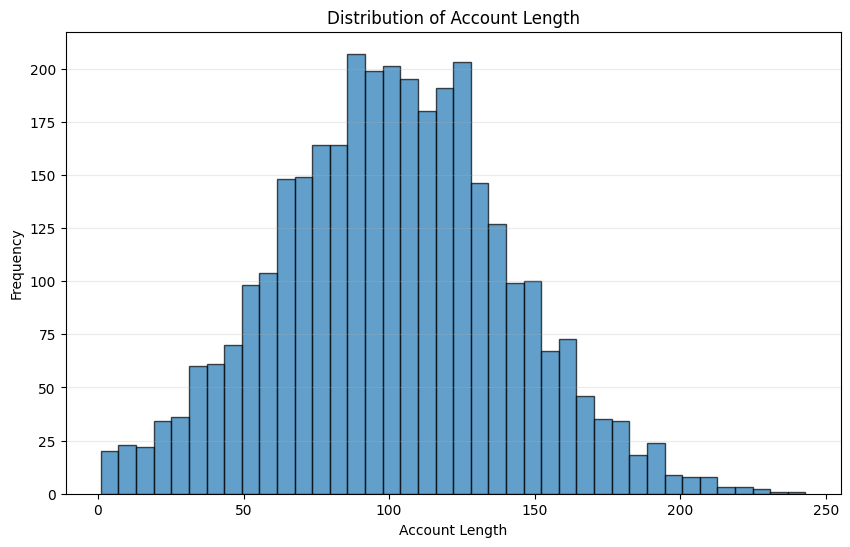

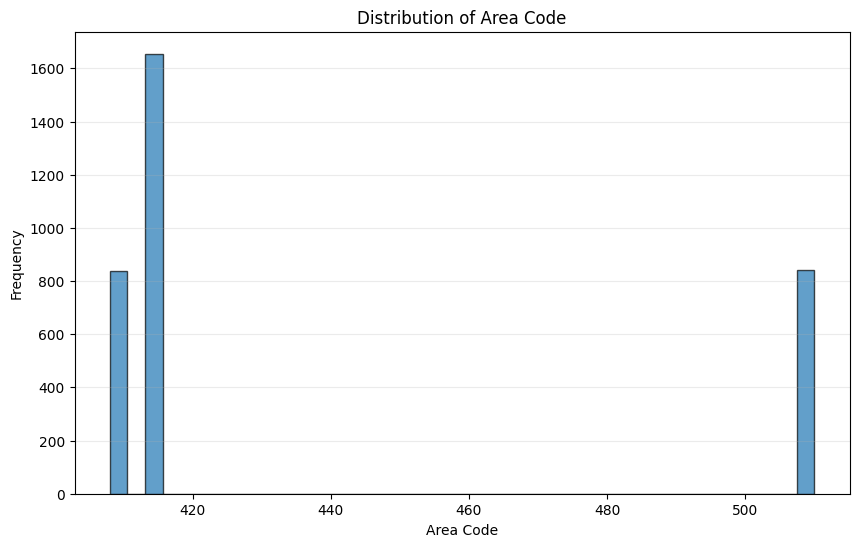

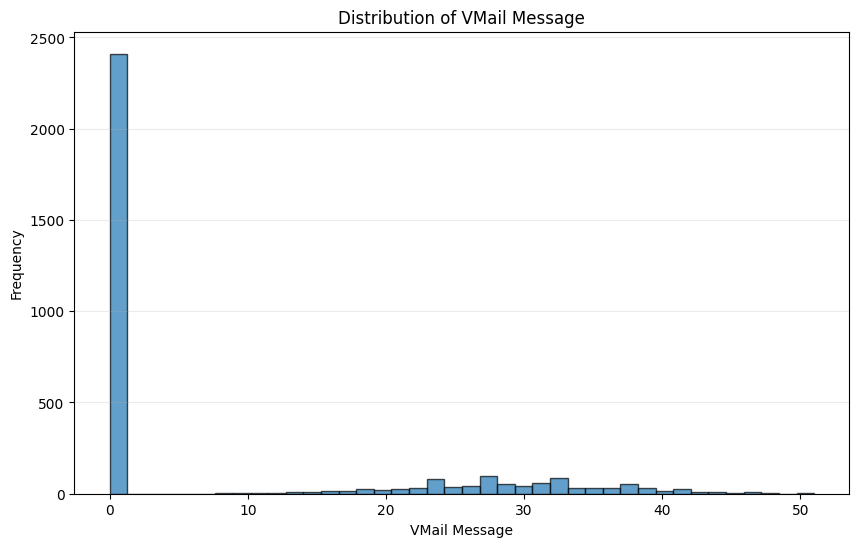

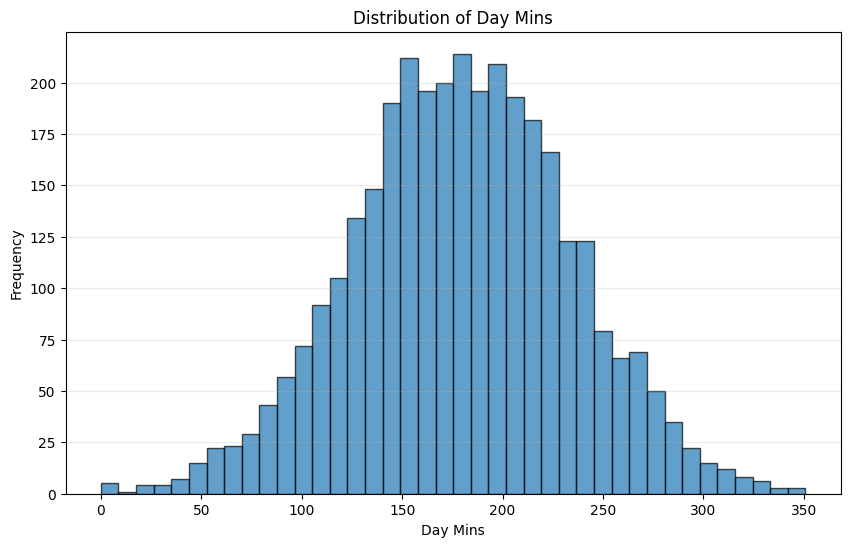

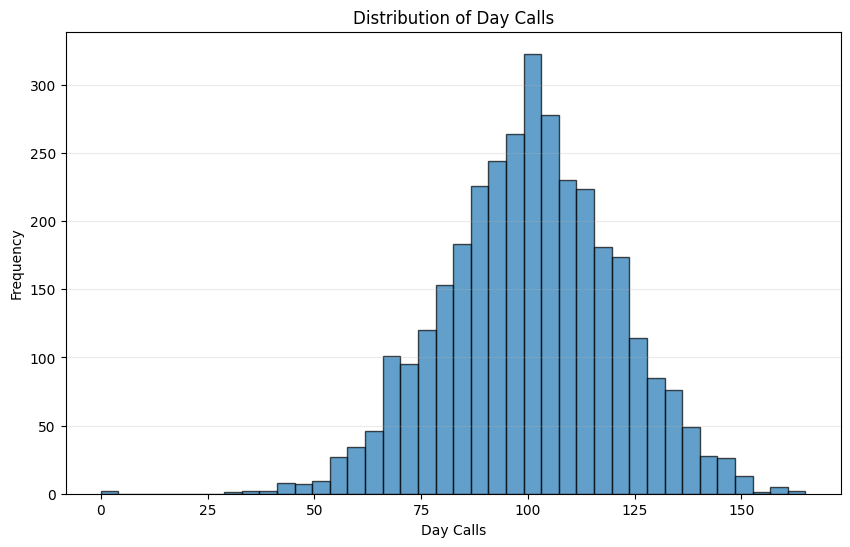

...

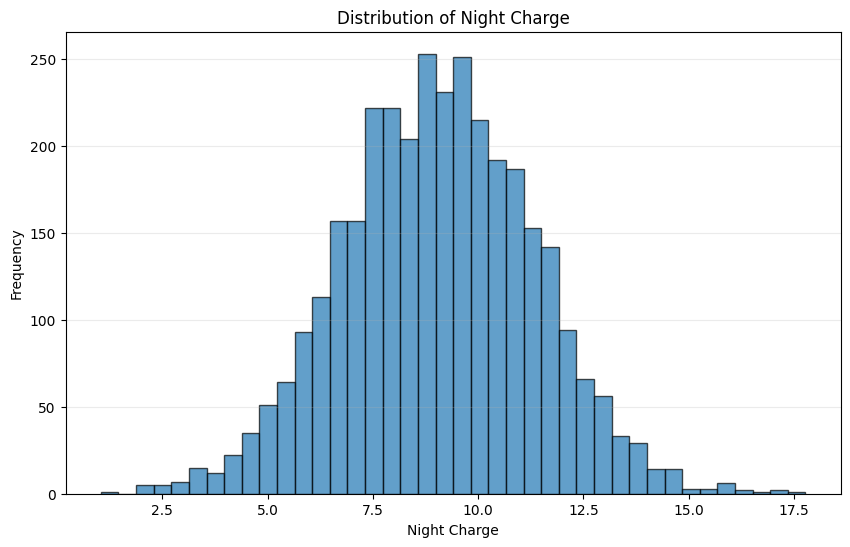

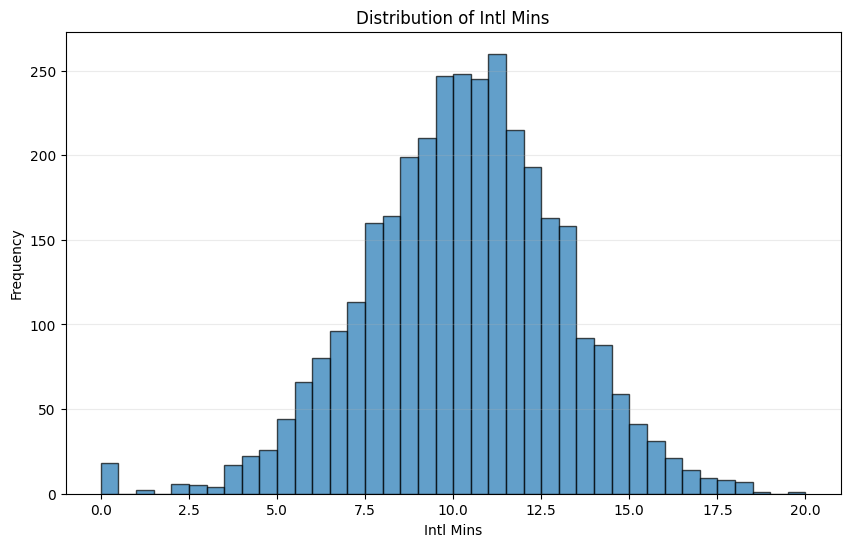

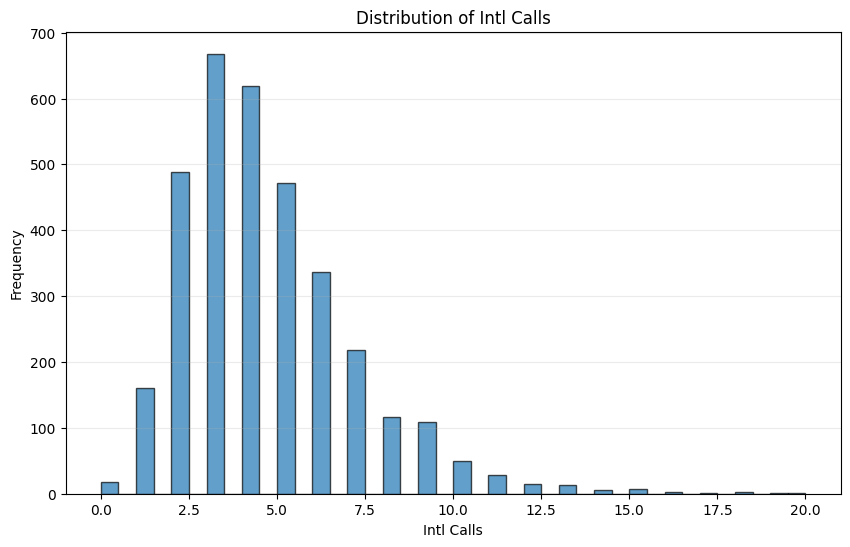

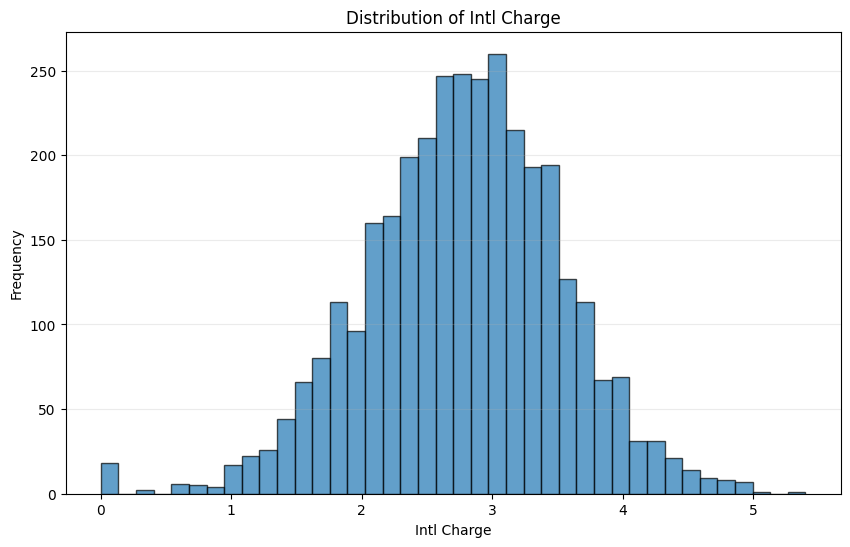

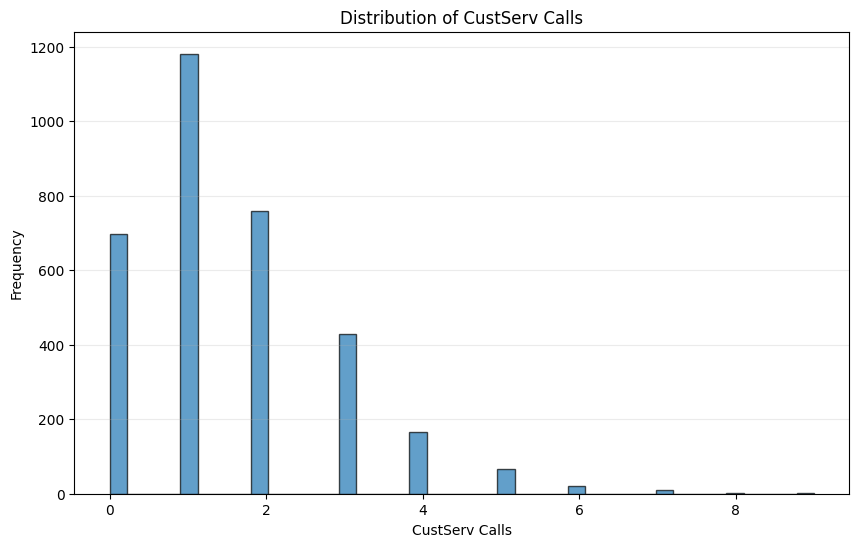

In [13]:
# Plot histograms for numerical features 
numerical_features = numerical_columns
for feature in numerical_features: 
    plt.figure(figsize=(10, 6)) 
    plt.hist(df[feature], bins=40, edgecolor='black', alpha=.7)
    plt.title(f'Distribution of {feature}') 
    plt.xlabel(feature) 
    plt.ylabel('Frequency') 
    plt.grid(axis='y', alpha=0.25) 
    plt.show() 

**Based on the histograms:**
1. `VMail Message:` 0 is the mode, because 72% of customers didn't use voice mail plan.
2. `Intl Calls:` heavily right-skewed.
3. `CustServ Calls:` heavily right-skewed.
4. `Area Code:` It seems that there isn't any pattern in it. By more investigating, if it would be clear that it doesn't give us any information we will drop it.
5. *The rest of the numerical features are approximately normal distributed.*


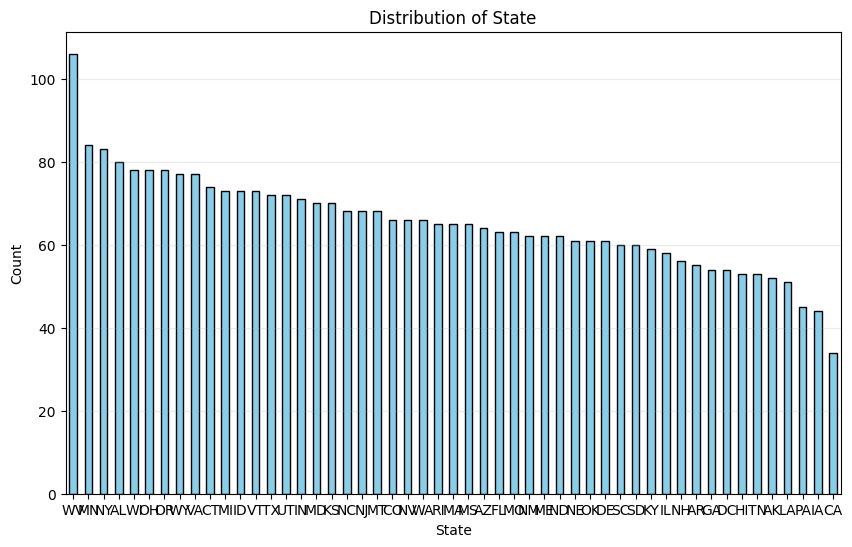

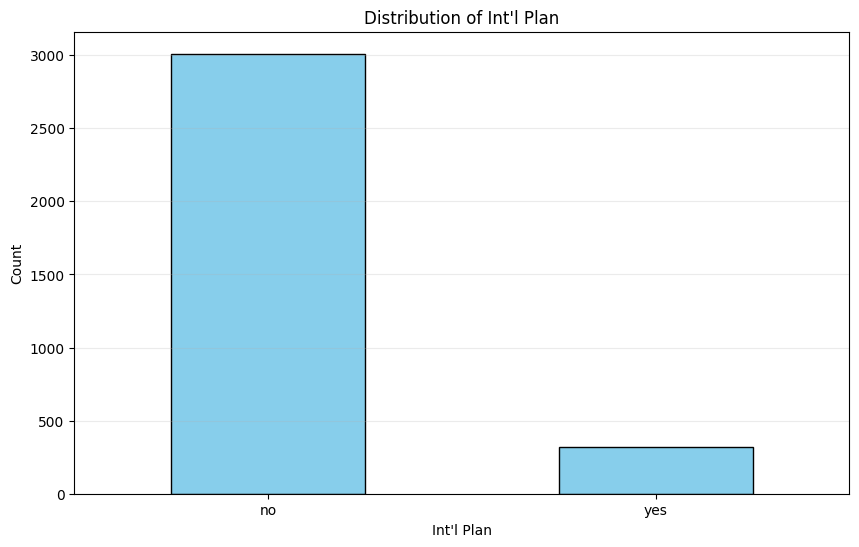

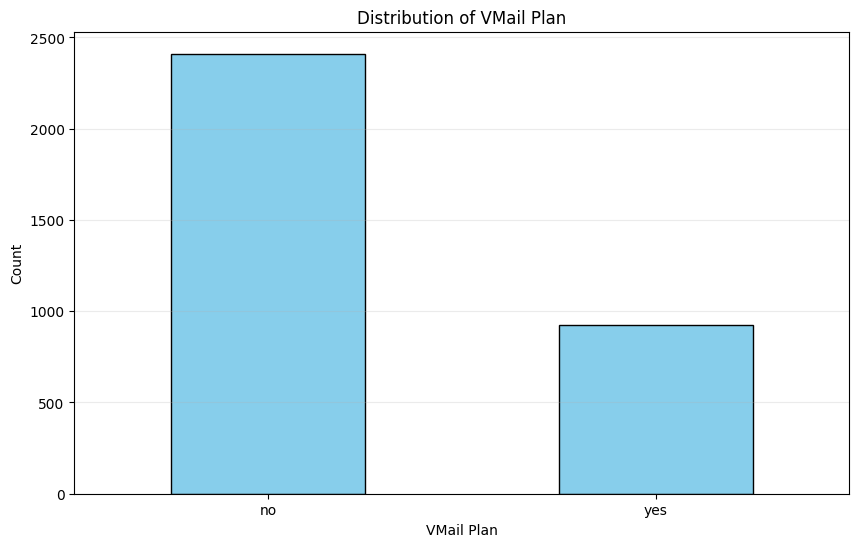

In [14]:
categorical_features = categorical_columns.drop(['Phone', 'Churn.'])

# Plot bar plots for categorical features 
for feature in categorical_features:
    plt.figure(figsize=(10, 6)) 
    df[feature].value_counts().plot(kind='bar', color='skyblue', edgecolor='black') 
    plt.title(f'Distribution of {feature}') 
    plt.xlabel(feature) 
    plt.ylabel('Count') 
    plt.xticks(rotation=0) 
    plt.grid(axis='y', alpha=0.25) 
    plt.show()

#### 2. Analyze Churn Rate: Plot the churn rate to understand the proportion of customers who have churned versus retained.

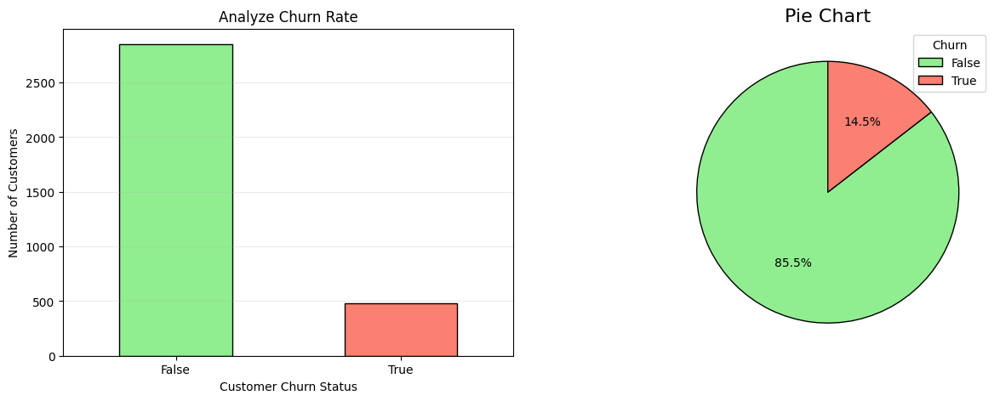

In [15]:
# Calculate the churn rate
churn_counts = df['Churn.'].value_counts()

plt.figure(figsize=(15, 5))

# Plot the churn rate
plt.subplot(1, 2, 1)
churn_counts.plot(kind='bar', color=['lightgreen', 'salmon'], edgecolor='black')
plt.title('Analyze Churn Rate')
plt.xlabel('Customer Churn Status')
plt.ylabel('Number of Customers')
plt.xticks(ticks=[0, 1], labels=['False', 'True'], rotation=0)
plt.grid(axis='y', alpha=0.25)

# Plotting comparative pie charts
plt.subplot(1, 2, 2)
plt.pie(churn_counts, 
            autopct='%1.1f%%', 
            colors=['lightgreen', 'salmon'], 
            startangle=90, 
            wedgeprops={'edgecolor': 'black'})
plt.title("Pie Chart", fontsize=16)
plt.legend(['False', 'True'], title="Churn")
plt.show()

Churning rate in the dataset is around 14.5%.

### **Step 5: Bivariate Analysis**

#### 1. Service Plans vs. Churn: Plot the churn rate against service plans (Int’l Plan, VMail Plan) to see if customers with certain plans have higher churn rates.

In [16]:
# Inspect the Churn column to see the current data type and values
print(df['Churn.'].unique())

# Clean the 'Churn.' column - Convert 'False.' to a proper boolean format
try:
    df['Churn.'] = df['Churn.'].apply(lambda x: True if 'True' in x else False)
except:
    pass

# Verify the conversion
print(df['Churn.'].unique())

['False.' 'True.']
[False  True]


In [17]:
def contingency_table_of(feature, target):
    contingency_table = pd.crosstab(df[feature], df[target], margins=True)

    print(f"Contingency Table of {feature} with {target}\n")
    print(pd.crosstab(df[feature], df[target], margins=True), "\n\n")
    
    return contingency_table

In [18]:
intlplan_churn_conttable = contingency_table_of("Int'l Plan", "Churn.")

Contingency Table of Int'l Plan with Churn.

Churn.      False  True   All
Int'l Plan                   
no           2664   346  3010
yes           186   137   323
All          2850   483  3333 




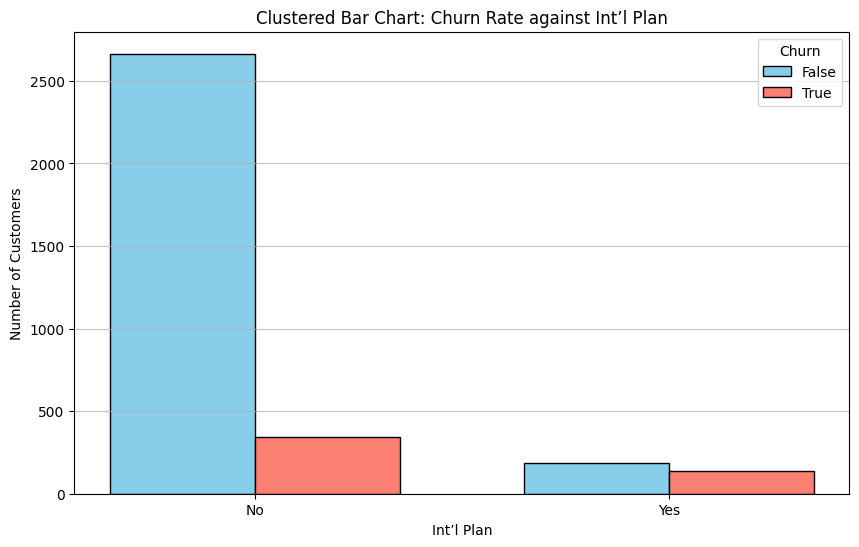

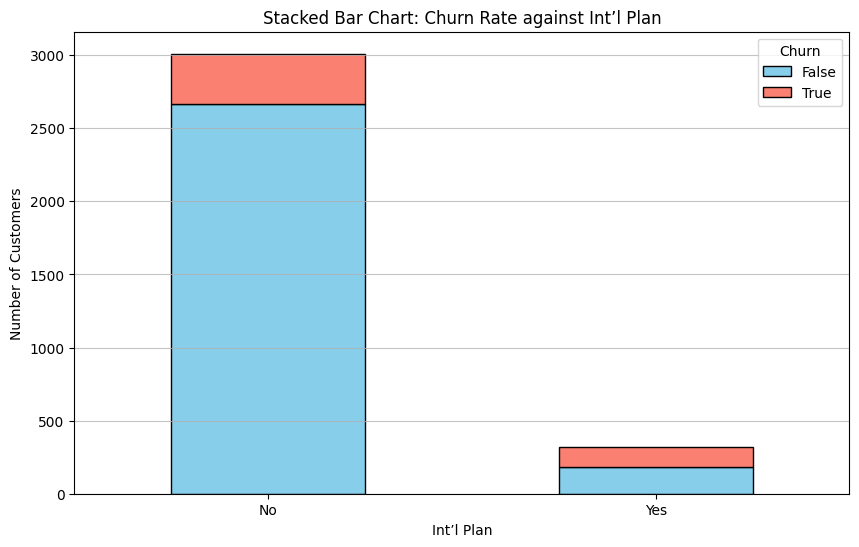

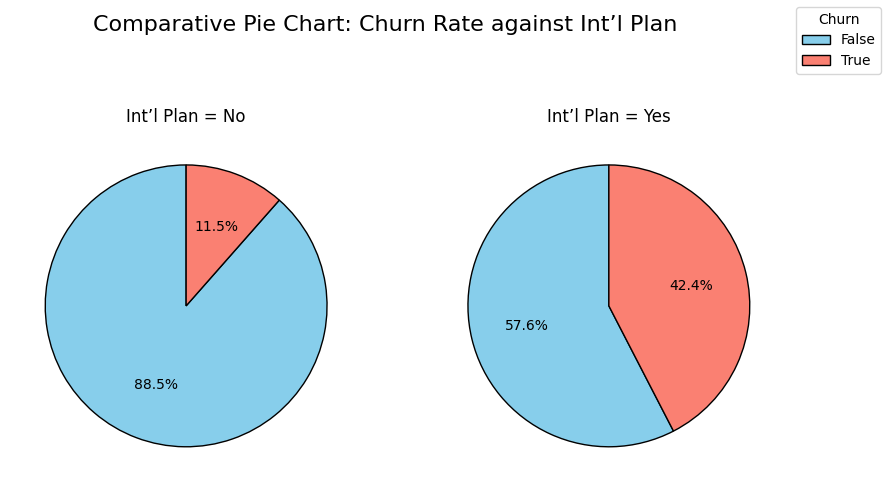

In [19]:
# Plotting clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Set positions for the bars
bar_width = 0.35
index = np.arange(len(intlplan_churn_conttable) - 1)  # Exclude the total row for bar plotting

# Plot bars for Not Churned and Churned
bars1 = ax.bar(index, intlplan_churn_conttable.iloc[:-1, 0], bar_width, label='False', color='skyblue', edgecolor='black')
bars2 = ax.bar(index + bar_width, intlplan_churn_conttable.iloc[:-1, 1], bar_width, label='True', color='salmon', edgecolor='black')

# Add labels, title, and legend
ax.set_xlabel('Int’l Plan')
ax.set_ylabel('Number of Customers')
ax.set_title('Clustered Bar Chart: Churn Rate against Int’l Plan')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(["No", "Yes"], rotation=0)
ax.legend()
ax.get_legend().set_title("Churn")

plt.grid(axis='y', alpha=0.75)
plt.show()

# Plotting stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Plot stacked bars
intlplan_churn_conttable.iloc[:-1, :2].plot(kind='bar', stacked=True, color=['skyblue', 'salmon'], edgecolor='black', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('Int’l Plan')
ax.set_ylabel('Number of Customers')
ax.set_title('Stacked Bar Chart: Churn Rate against Int’l Plan')
ax.set_xticklabels(["No", "Yes"], rotation=0)
ax.legend(['False', 'True'])
ax.get_legend().set_title("Churn")
plt.grid(axis='y', alpha=0.75)
plt.show()

# Extracting the necessary data for pie charts
no_plan_counts = intlplan_churn_conttable.loc['no']
yes_plan_counts = intlplan_churn_conttable.loc['yes']

# Plotting comparative pie charts
fig, axes = plt.subplots(1, 2, figsize=(10, 6))
fig.suptitle("Comparative Pie Chart: Churn Rate against Int’l Plan", fontsize=16)

# Pie chart for No International Plan
axes[0].pie(no_plan_counts[:-1], 
            autopct='%1.1f%%', 
            colors=['skyblue', 'salmon'], 
            startangle=90, 
            wedgeprops={'edgecolor': 'black'})

axes[0].set_title('Int’l Plan = No')

# Pie chart for Has International Plan
axes[1].pie(yes_plan_counts[:-1], 
            autopct='%1.1f%%', 
            colors=['skyblue', 'salmon'], 
            startangle=90, 
            wedgeprops={'edgecolor': 'black'})

axes[1].set_title('Int’l Plan = Yes')

fig.legend(['False', 'True'], title="Churn")
plt.show()

$\downarrow$

Customers who have international plan are approximately four times more likely to churn ($11.5\%  \rightarrow 42.4\%$).

In [20]:
vmailplan_churn_conttable = contingency_table_of("VMail Plan", "Churn.")

Contingency Table of VMail Plan with Churn.

Churn.      False  True   All
VMail Plan                   
no           2008   403  2411
yes           842    80   922
All          2850   483  3333 




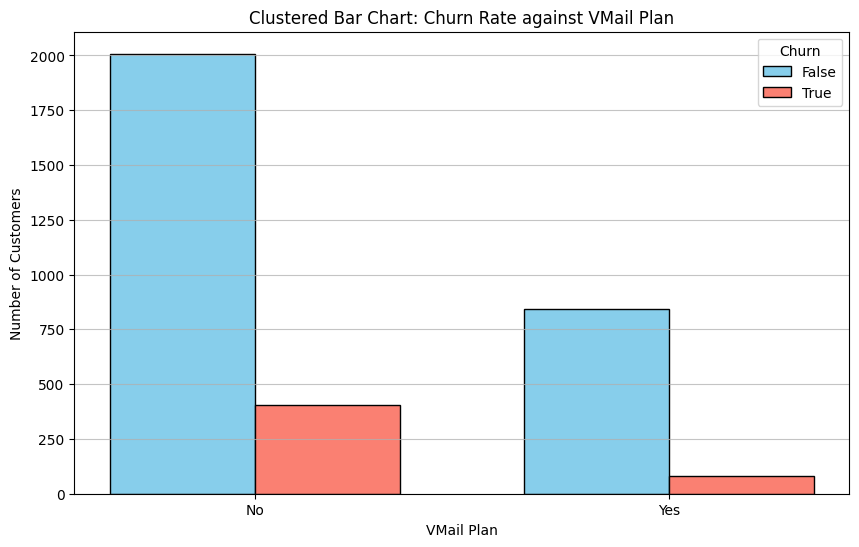

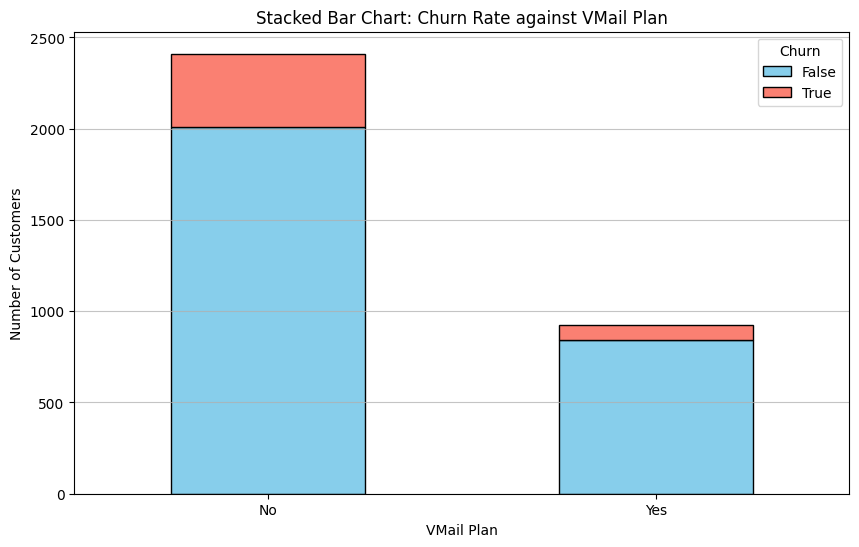

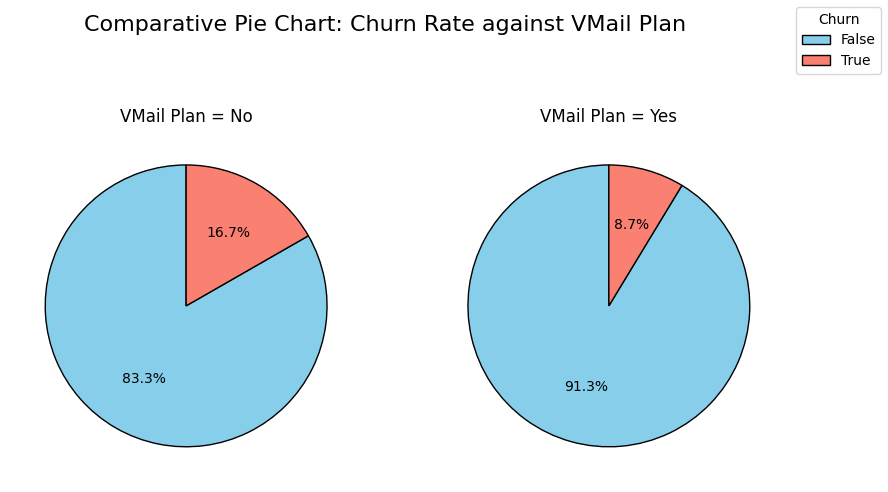

In [21]:
# Plotting clustered bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Set positions for the bars
bar_width = 0.35
index = np.arange(len(vmailplan_churn_conttable) - 1)  # Exclude the total row for bar plotting

# Plot bars for Not Churned and Churned
bars1 = ax.bar(index, vmailplan_churn_conttable.iloc[:-1, 0], bar_width, label='False', color='skyblue', edgecolor='black')
bars2 = ax.bar(index + bar_width, vmailplan_churn_conttable.iloc[:-1, 1], bar_width, label='True', color='salmon', edgecolor='black')

# Add labels, title, and legend
ax.set_xlabel('VMail Plan')
ax.set_ylabel('Number of Customers')
ax.set_title('Clustered Bar Chart: Churn Rate against VMail Plan')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(["No", "Yes"], rotation=0)
ax.legend()
ax.get_legend().set_title("Churn")

plt.grid(axis='y', alpha=0.75)
plt.show()


# Plotting stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Plot stacked bars
vmailplan_churn_conttable.iloc[:-1, :2].plot(kind='bar', stacked=True, color=['skyblue', 'salmon'], edgecolor='black', ax=ax)

# Add labels, title, and legend
ax.set_xlabel('VMail Plan')
ax.set_ylabel('Number of Customers')
ax.set_title('Stacked Bar Chart: Churn Rate against VMail Plan')
ax.set_xticklabels(["No", "Yes"], rotation=0)
ax.legend(['False', 'True'])
ax.get_legend().set_title("Churn")
plt.grid(axis='y', alpha=0.75)
plt.show()



# Extracting the necessary data for pie charts 
no_plan_counts = vmailplan_churn_conttable.loc['no'] 
yes_plan_counts = vmailplan_churn_conttable.loc['yes']

# Plotting comparative pie charts
fig, axes = plt.subplots(1, 2, figsize=(10, 6))
fig.suptitle("Comparative Pie Chart: Churn Rate against VMail Plan", fontsize=16)

# Pie chart for No International Plan
axes[0].pie(no_plan_counts[:-1], 
            autopct='%1.1f%%', 
            colors=['skyblue', 'salmon'], 
            startangle=90, 
            wedgeprops={'edgecolor': 'black'})

axes[0].set_title('VMail Plan = No')

# Pie chart for Has International Plan
axes[1].pie(yes_plan_counts[:-1], 
            autopct='%1.1f%%', 
            colors=['skyblue', 'salmon'], 
            startangle=90, 
            wedgeprops={'edgecolor': 'black'})

axes[1].set_title('VMail Plan = Yes')

fig.legend(['False', 'True'], title="Churn")
plt.show()

$\downarrow$

Customers who have voice mail plan are approximately two times less likely to churn ($16.7\%  \rightarrow 8.7\%$).

#### 2. Customer Service Calls vs. Churn: Visualize the number of customer service calls segmented by churn status.


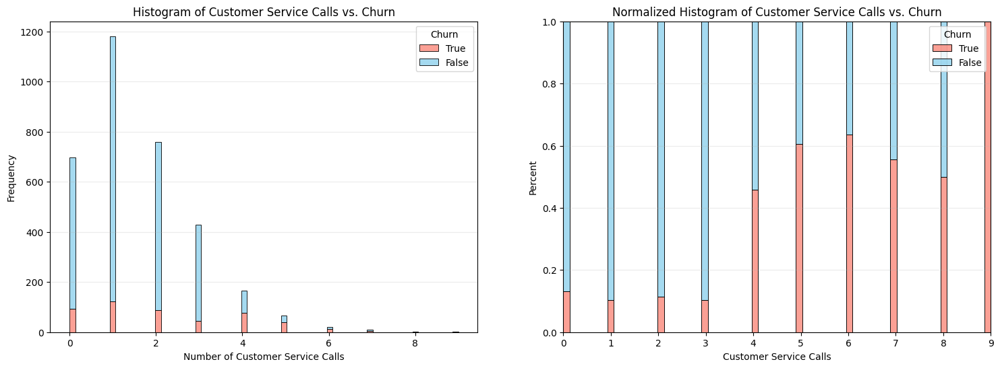

In [22]:
# Plotting the histogram with churn overlay
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)

sns.histplot(data=df, x='CustServ Calls', hue='Churn.', multiple='stack', palette=['skyblue', 'salmon'], edgecolor='black')
plt.xlabel('Number of Customer Service Calls')
plt.ylabel('Frequency')
plt.title('Histogram of Customer Service Calls vs. Churn')
plt.legend(['True','False'], title="Churn")
plt.grid(axis='y', alpha=0.25)

# Plotting the histogram with fill position
plt.subplot(1, 2, 2)
sns.histplot(data=df, x='CustServ Calls', hue='Churn.', multiple='fill', palette=['skyblue', 'salmon'], edgecolor='black')
plt.xlabel('Customer Service Calls')
plt.ylabel('Percent')
plt.title('Normalized Histogram of Customer Service Calls vs. Churn')
plt.legend(title='Churn', labels=['True','False'])
plt.grid(axis='y', alpha=0.25)
plt.show()

After the **3rd time** calling the customer service, churning rate increases four or more times.

#### 3. Usage and Churn: Compare distributions of high-usage metrics (e.g., Day Mins, Intl Mins) between churned and non-churned customers.

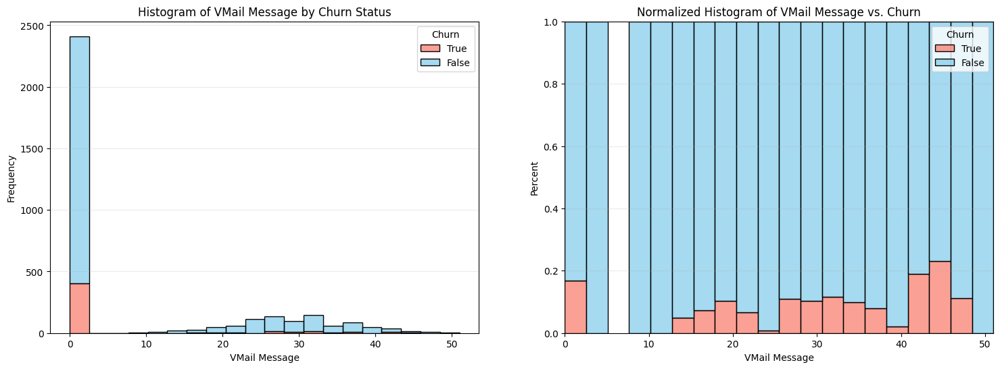

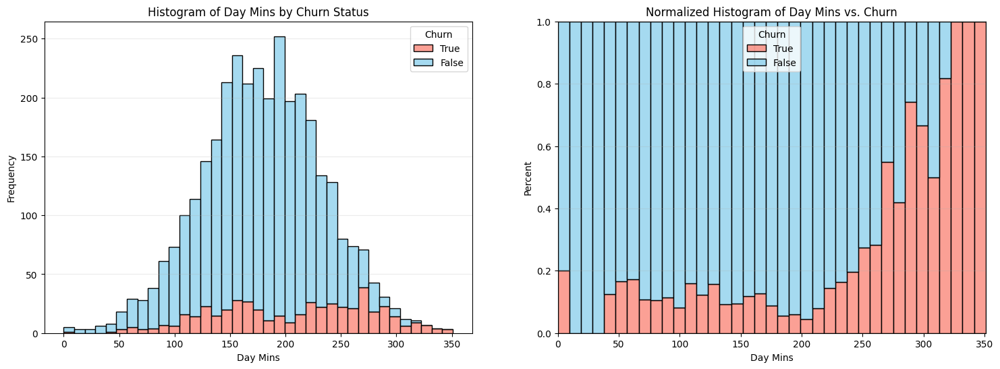

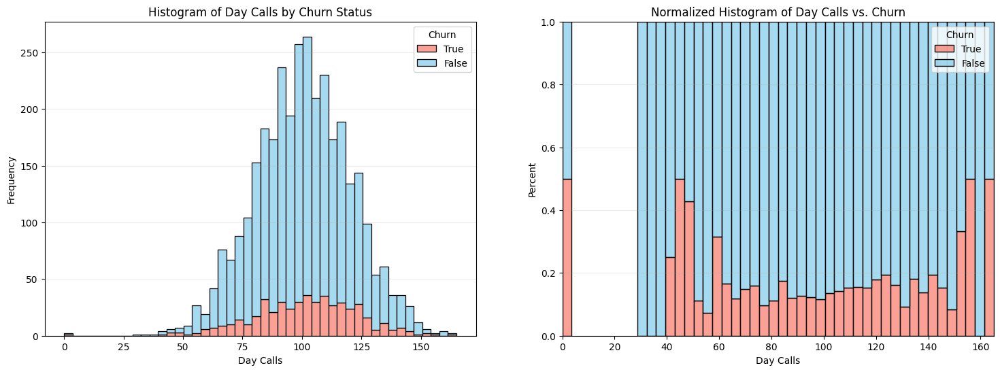

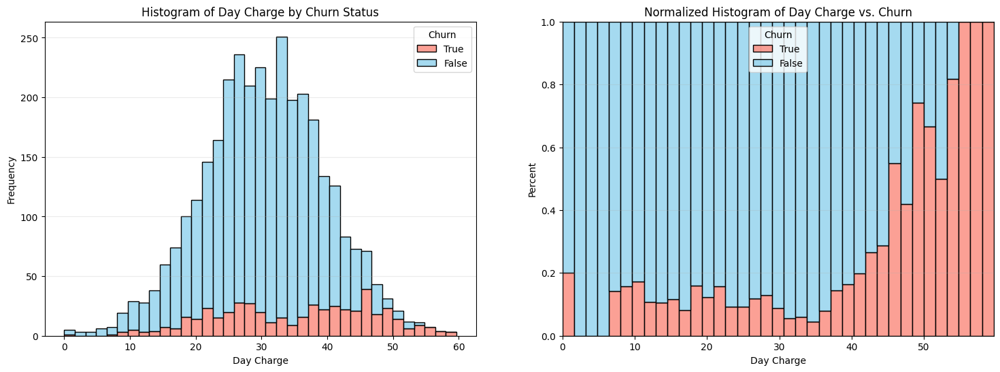

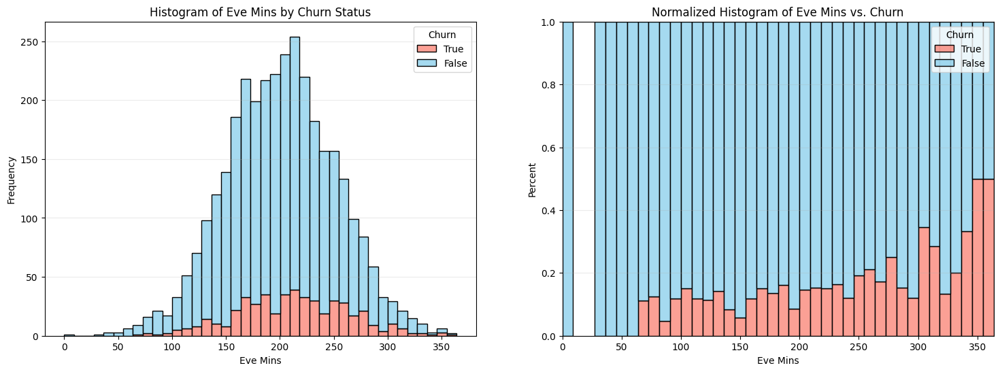

...

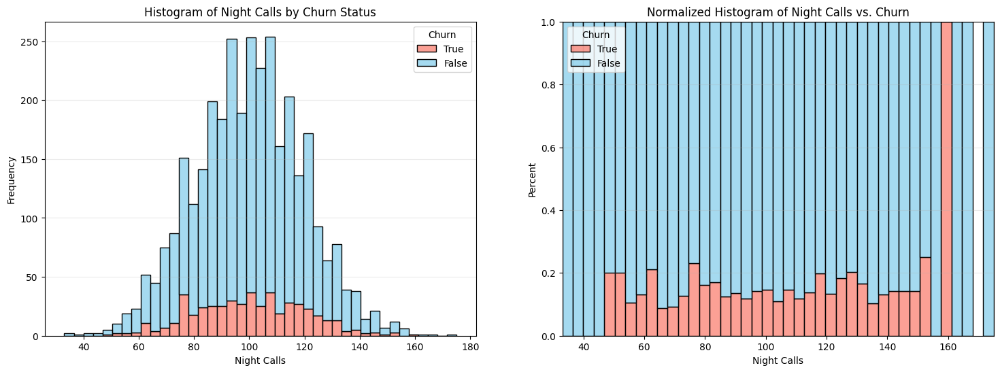

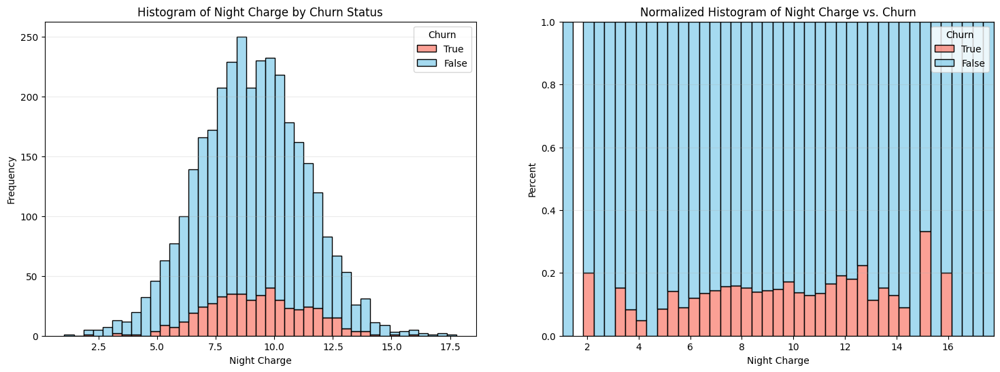

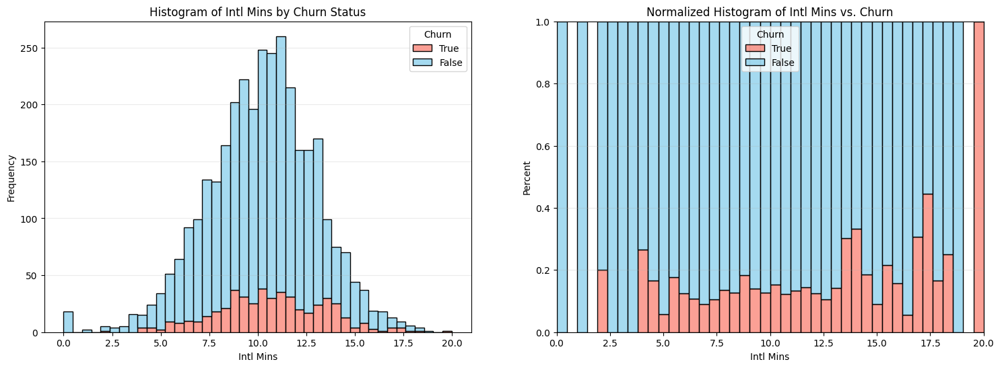

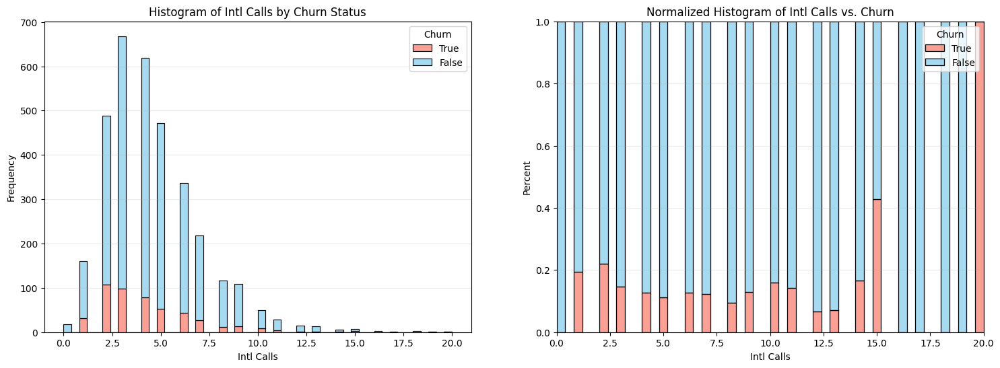

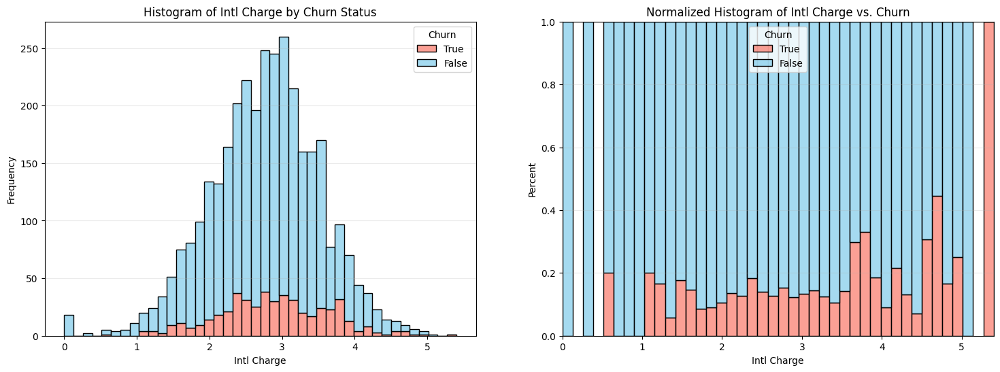

In [23]:
# List of high-usage metrics
usage_metrics = ['VMail Message', 'Day Mins', 'Day Calls', 'Day Charge',
                 'Eve Mins', 'Eve Calls', 'Eve Charge',
                 'Night Mins', 'Night Calls', 'Night Charge',
                 'Intl Mins', 'Intl Calls', 'Intl Charge']
# usage_metrics = df.select_dtypes(include=['number']).columns

# Plotting the histograms
for metric in usage_metrics:
    plt.figure(figsize=(18, 6))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data=df, x=metric, hue='Churn.', multiple='stack', palette=['skyblue', 'salmon'], edgecolor='black')
    plt.xlabel(metric)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {metric} by Churn Status')
    plt.legend(['True','False'], title="Churn")
    plt.grid(axis='y', alpha=0.25)
    
    # Plotting the histogram with fill position
    plt.subplot(1, 2, 2)
    sns.histplot(data=df, x=metric, hue='Churn.', multiple='fill', palette=['skyblue', 'salmon'], edgecolor='black')
    plt.xlabel(metric)
    plt.ylabel('Percent')
    plt.title(f'Normalized Histogram of {metric} vs. Churn')
    plt.legend(title='Churn', labels=['True','False'])
    plt.grid(axis='y', alpha=0.25)
    plt.show()    
    
    # Box plot for non-churned and churned customers
    """plt.figure(figsize=(12, 6))
    sns.boxplot(hue='Churn.', y=metric, data=df, palette=['skyblue', 'salmon'], legend=False)

    # Adding labels and title
    plt.xlabel('Churn Status')
    plt.ylabel(metric)
    plt.title(f'Box Plot of {metric} by Churn Status')
    plt.grid(axis='y', alpha=0.75)
    plt.show()"""


- Customers with Day Minutes $>200$ tend to churn extremely more.

- Customers with Evening Minutes $>300$ tend to churn more.

*So, high-usage customers show higher churn rate.*

### **Step 6: Scatter Plot Analysis**

####  Usage Features Correlation: Create scatter plots to visualize the relationship between pairs of usage features such as:
- Day Mins vs. Day Charge
- Intl Mins vs. Intl Charge


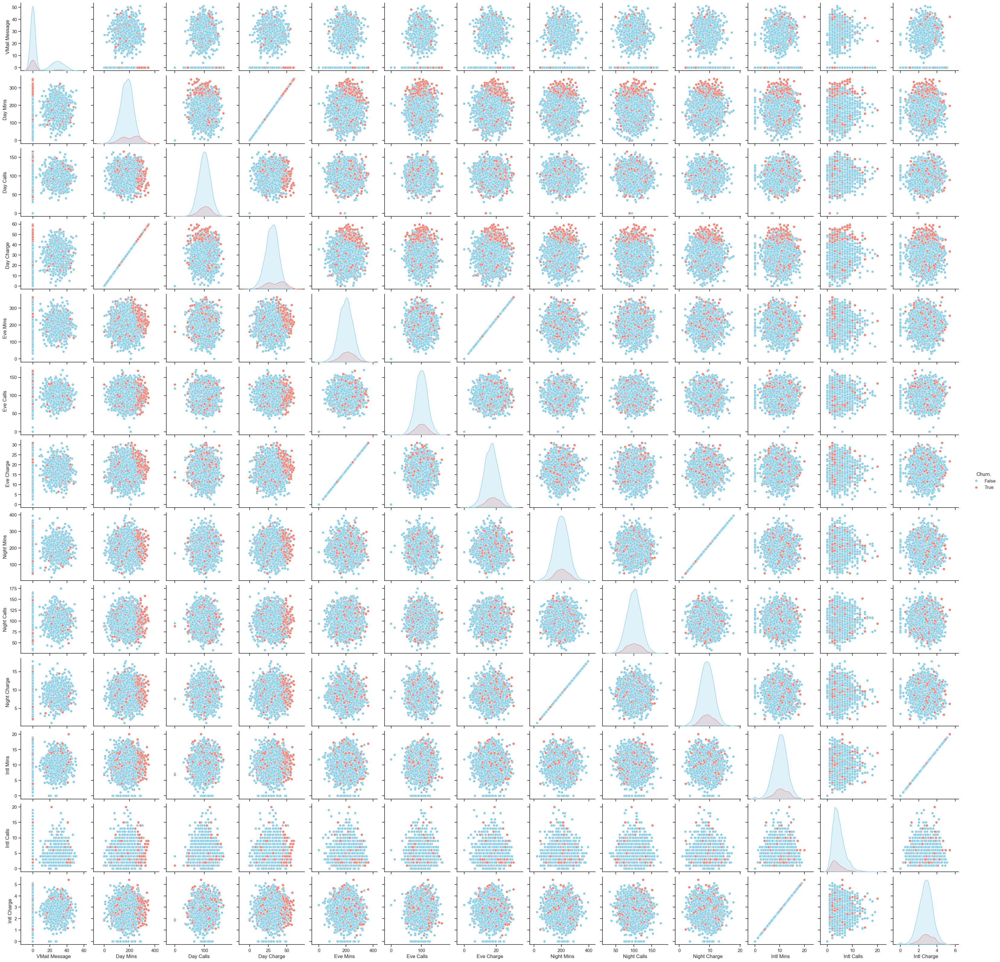

In [24]:
df_selected = df[usage_metrics + ['Churn.']]
sns.set_theme(style="ticks")
sns.pairplot(df_selected, hue="Churn.", palette=['skyblue', 'salmon'])

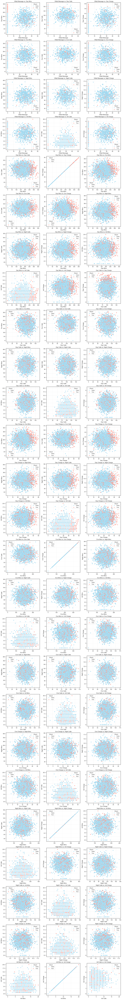

In [25]:
count=1
total = len(usage_metrics)*(len(usage_metrics)-1)//2
plt.figure(figsize=(18, 6*(total//3)))

# Scatter plots
for i in range(len(usage_metrics)):
    for j in range(i+1, len(usage_metrics)):
        m, n = usage_metrics[i], usage_metrics[j]
        plt.subplot(total//3, 3, count)
        count+=1
        sns.scatterplot(data=df, x=m, y=n, hue="Churn.", palette=['skyblue', 'salmon'])
        plt.title(f'{m} vs. {n}')
        plt.xlabel(f'{m}')
        plt.ylabel(f'{n}')
        plt.legend(title='Churn')
        plt.grid(True, alpha=.25)

plt.show()


$\downarrow$

Based on the matrix scatterplot ,there is a direct linear relationship between minutes used and charges (Day, Eve, Night, Intl) so we have to drop charges (or minutes used).

### **Step 7: Draw Conclusions**




#### 1. Summarize Insights: Based on your findings, list the main factors that seem to influence customer churn.

- Customers with the International Plan tend to churn more frequently.
- Customers with the Voice Mail Plan tend to churn less frequently.
- Customers with four or more Customer Service Calls churn more than four times as often as the other customers.
- Customers with high Day Minutes and Evening Minutes tend to churn at a higher rate than the other customers.


#### 2. Interpret Trends: Consider why certain features might impact churn. For example, why might frequent customer service calls correlate with churn?

- Four times increase in churning rate after 3rd call, shows that customer service center is not obviously able to solve customer problems so we should notice them to take it serious and retain them by gift pakages and follow their matters untill the end. :)